<a href="https://colab.research.google.com/github/Cloud2602/Risk-Estimation-from-Multi-Sensor-Motion-Data/blob/main/Risk_estimation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Risk Estimation from Multi Sensor Motion Data

### Download Dataset

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# For v1.0 version of mini dataset
!wget https://man-truckscenes.s3.eu-central-1.amazonaws.com/release/mini/man-truckscenes_metadata_v1.0-mini.zip
!wget https://man-truckscenes.s3.eu-central-1.amazonaws.com/release/mini/man-truckscenes_sensordata_v1.0-mini.zip
!unzip "man-truckscenes_*.zip"

Streaming output truncated to the last 5000 lines.
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716774953983.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775005589.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775052244.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775103591.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775154645.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775202114.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775253343.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775351876.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775403897.pcd  
  inflating: man-truckscenes/sweeps/RADAR_RIGHT_FRONT/RADAR_RIGHT_FRONT_1706716775455406.pcd  

In [2]:
%%bash
mkdir -p /content/data
cd "/content/drive/MyDrive"
unzip -o "man-truckscenes_*.zip" -d "/content"

Archive:  man-truckscenes_sensordata_v1.0-mini.zip
   creating: /content/man-truckscenes/
   creating: /content/man-truckscenes/samples/
   creating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473372666841.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473373166828.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473373666803.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473374166792.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473374667278.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473375166805.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BACK_1695473375666769.jpg  
  inflating: /content/man-truckscenes/samples/CAMERA_LEFT_BACK/CAMERA_LEFT_BAC


2 archives were successfully processed.


Open github repository

In [ ]:
!git clone https://github.com/Cloud2602/Risk-Estimation-from-Multi-Sensor-Motion-Data.git

Cloning into 'Risk-Estimation-from-Multi-Sensor-Motion-Data'...
remote: Enumerating objects: 12, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (10/10), done.
Receiving objects: 100% (12/12), done.
Resolving deltas: 100% (2/2), done.
remote: Total 12 (delta 2), reused 0 (delta 0), pack-reused 0 (from 0)


## Initialization

In [3]:
!pip install truckscenes-devkit[all]

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.0/71.0 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 134.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 24.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 126.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.1/69.1 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.9/386.9 kB 39.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.5/133.5 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 102.0 MB/s eta 0:00:00
   ━

In [4]:
%matplotlib inline
from truckscenes import TruckScenes

trucksc = TruckScenes('v1.0-mini', 'man-truckscenes', True)

Loading truckscenes tables for version v1.0-mini...
11 attribute,
18 calibrated_sensor,
27 category,
20090 ego_motion_cabin,
20089 ego_motion_chassis,
20116 ego_pose,
1094 instance,
400 sample,
25750 sample_annotation,
43556 sample_data,
10 scene,
18 sensor,
4 visibility,
Done loading in 0.909 seconds.
Reverse indexing ...
Done reverse indexing in 0.2 seconds.


## BEV

In [ ]:
!mkdir /content/man-truckscenes/samples/BEV


In [ ]:
import json

file_path = "/content/man-truckscenes/v1.0-mini/sample_data.json"

try:
    with open(file_path, 'r') as f:
        data = json.load(f)
    print("✅ JSON caricato correttamente.")
except json.JSONDecodeError as e:
    print("❌ Errore nel parsing del file JSON:")
    print(f"  Messaggio: {e.msg}")
    print(f"  Riga: {e.lineno}, Colonna: {e.colno}")
    print(f"  Posizione: {e.pos}")

    # Stampa la riga problematica
    with open(file_path, 'r') as f:
        lines = f.readlines()
        if e.lineno <= len(lines):
            print("\n🔍 Riga con l'errore:")
            print(lines[e.lineno - 1].rstrip())
        else:
            print("⚠️ Impossibile accedere alla riga dell'errore: fuori intervallo.")
except FileNotFoundError:
    print("❌ File non trovato.")
except Exception as e:
    print(f"❌ Altro errore: {e}")


✅ JSON caricato correttamente.


LIDAR_LEFT: 80729 punti
LIDAR_RIGHT: 81221 punti
LIDAR_TOP_FRONT: 17458 punti
LIDAR_TOP_LEFT: 23344 punti
LIDAR_TOP_RIGHT: 22034 punti
LIDAR_REAR: 17262 punti
Totale punti uniti nel frame 0: 242048


<ipython-input-7-1be36ac0cd04>:35: RuntimeWarning: invalid value encountered in divide
  intensities_scaled = ((intensities - np.min(intensities)) /
<ipython-input-7-1be36ac0cd04>:36: RuntimeWarning: invalid value encountered in cast
  np.ptp(intensities) * 255).astype(np.uint8)
<ipython-input-7-1be36ac0cd04>:46: RuntimeWarning: overflow encountered in scalar add
  R[xi, yi] += 1


AttributeError: 'NoneType' object has no attribute 'savefig'

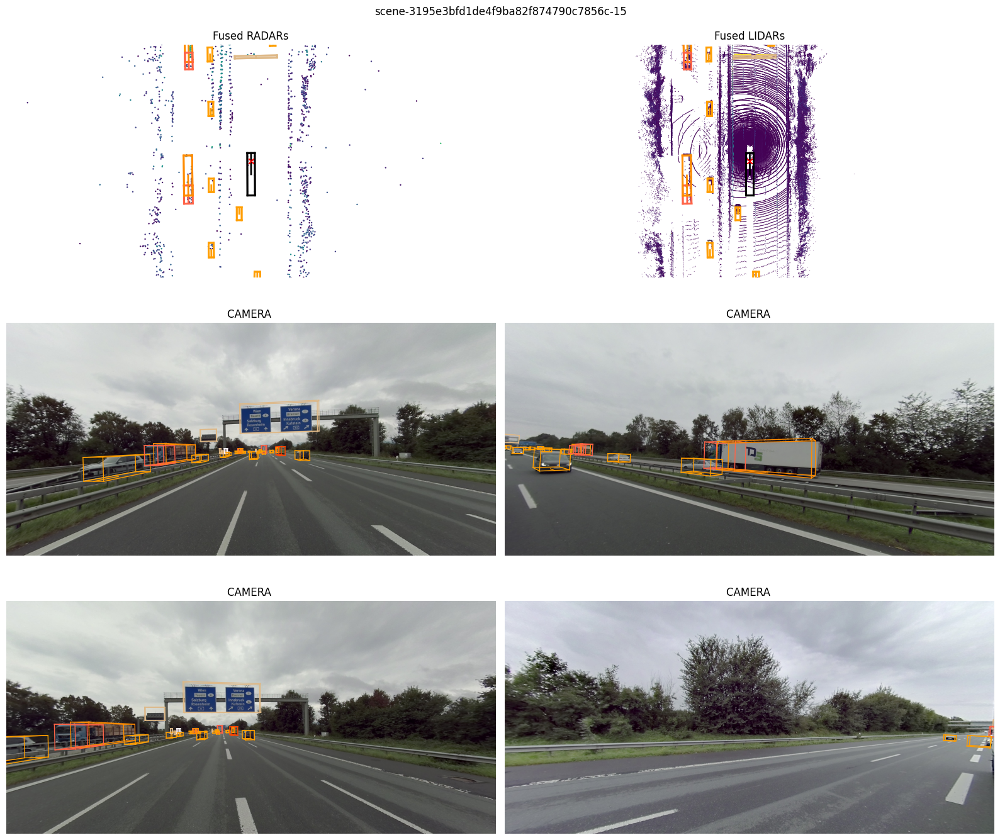

In [ ]:
from scipy.spatial.transform import Rotation as R
import numpy as np
import json
import open3d as o3d
import glob
import os
import cv2
from PIL import Image
from matplotlib import pyplot as plt
from truckscenes import TruckScenes  # Assicurati di aver installato il devkit

def bev_rgb_enhanced(points, intensities=None,
                     res=0.1,
                     side_range=(-25, 25), fwd_range=(0, 50),
                     height_range=(-2, 2), ground_threshold=-1.5):

    x, y, z = points[:, 0], points[:, 1], points[:, 2]
    if intensities is None:
        intensities = np.ones_like(x)

    mask = (
        (x > fwd_range[0]) & (x < fwd_range[1]) &
        (y > side_range[0]) & (y < side_range[1]) &
        (z > ground_threshold)
    )
    x, y, z, intensities = x[mask], y[mask], z[mask], intensities[mask]

    x_img = ((x - fwd_range[0]) / res).astype(np.int32)
    y_img = ((y - side_range[0]) / res).astype(np.int32)
    H = int((fwd_range[1] - fwd_range[0]) / res)
    W = int((side_range[1] - side_range[0]) / res)

    z_scaled = ((np.clip(z, *height_range) - height_range[0]) /
                (height_range[1] - height_range[0]) * 255).astype(np.uint8)
    intensities_scaled = ((intensities - np.min(intensities)) /
                          np.ptp(intensities) * 255).astype(np.uint8)

    R = np.zeros((H, W), dtype=np.uint8)
    G = np.zeros((H, W), dtype=np.uint8)
    B = np.zeros((H, W), dtype=np.uint8)
    count = np.zeros((H, W), dtype=np.uint16)

    for xi, yi, zi, ii in zip(x_img, y_img, z_scaled, intensities_scaled):
        G[xi, yi] = max(G[xi, yi], zi)
        B[xi, yi] = max(B[xi, yi], ii)
        R[xi, yi] += 1
        count[xi, yi] += 1

    R = np.clip((R / R.max()) * 255, 0, 255).astype(np.uint8)

    R_eq = cv2.equalizeHist(R)
    G_eq = cv2.equalizeHist(G)
    B_eq = cv2.equalizeHist(B)

    bev = np.stack([R_eq, G_eq, B_eq], axis=-1)
    bev = np.array(Image.fromarray(bev).resize((512, 512)))

    return bev


def build_transformation_matrix(rotation_quat, translation):
    r = R.from_quat([rotation_quat[1], rotation_quat[2], rotation_quat[3], rotation_quat[0]])
    rot_matrix = r.as_matrix()
    trans_matrix = np.eye(4)
    trans_matrix[:3, :3] = rot_matrix
    trans_matrix[:3, 3] = translation
    return trans_matrix

def transform_pointcloud(points, transform):
    points_h = np.hstack((points, np.ones((points.shape[0], 1))))
    transformed = (transform @ points_h.T).T
    return transformed[:, :3]

# === Inizializzazione dataset ===
sensor_map = {
    "1c4f2bbb64f847a193c748c1c14f0574": "LIDAR_LEFT",
    "fe19aa64da874708a8cd417103e7cdc7": "LIDAR_RIGHT",
    "3f53edcde9e44caaba5e689726c7aab7": "LIDAR_TOP_FRONT",
    "9ecd75e3eaf643d5b1d5a6cefba7f1f3": "LIDAR_TOP_LEFT",
    "fcddf720b15b4bc3b59eef0bdf3e0f94": "LIDAR_TOP_RIGHT",
    "40dad62928a4498699eebf9aa7f4be98": "LIDAR_REAR",
}

with open("man-truckscenes/v1.0-mini/calibrated_sensor.json", "r") as f:
    calibration_data = json.load(f)

sensor_transforms = {}
for entry in calibration_data:
    token = entry["sensor_token"]
    if token in sensor_map:
        T = build_transformation_matrix(entry["rotation"], entry["translation"])
        sensor_transforms[sensor_map[token]] = T

# === Carica devkit e sample_data.json ===
with open("man-truckscenes/v1.0-mini/sample_data.json") as f:
    sample_data = json.load(f)

# === File LiDAR ===
base_dir = "/content/man-truckscenes/samples"
sensor_dirs = list(sensor_transforms.keys())

sensor_files = {}
for sensor in sensor_dirs:
    files = sorted(glob.glob(os.path.join(base_dir, sensor, "*.pcd")))
    sensor_files[sensor] = files

num_frames = min(len(files) for files in sensor_files.values())

# === Ciclo principale ===
for i in range(num_frames):
    all_points = []

    for sensor in sensor_dirs:
        file_path = sensor_files[sensor][i]
        pcd = o3d.io.read_point_cloud(file_path)
        points = np.asarray(pcd.points)
        T = sensor_transforms[sensor]
        points_transformed = transform_pointcloud(points, T)
        all_points.append(points_transformed)
        print(f"{sensor}: {points_transformed.shape[0]} punti")

    merged_points = np.vstack(all_points)
    print(f"Totale punti uniti nel frame {i}: {merged_points.shape[0]}")

    # === 1. Salva immagine BEV personalizzata ===
    bev_image = bev_rgb_enhanced(merged_points)
    Image.fromarray(bev_image).save(f"/content/bev_frame_{i:05d}.png")

    # === 2. Trova sample_token usando LIDAR_LEFT ===
    reference_filename = os.path.basename(sensor_files["LIDAR_TOP_FRONT"][i])
    sample_token = None
    for entry in sample_data:
        if reference_filename in entry["filename"]:
            sample_token = entry["sample_token"]
            break

    # === 3. Render devkit image con bounding box ===
    if sample_token:
        fig = trucksc.render_sample(sample_token)
        fig.savefig(f"/content/render_sample_{i:05d}.png")
        plt.close(fig)


In [ ]:
# Mostra i primi 5 sample_token validi
valid_samples = trucksc.sample
for i in range(5):
    print(f"[{i}] sample_token:", valid_samples[i]['token'])


[0] sample_token: 32d2bcf46e734dffb14fe2e0a823d059
[1] sample_token: deb7b3f332f042d49e7636d6e4959354
[2] sample_token: a574551be31547e4b7c78ff87c75abb3
[3] sample_token: 1393759bf6ff4f8e88deff0da0dc2aca
[4] sample_token: 368662645c194921b716c026347db664


In [5]:
record = trucksc.get('sample', "32d2bcf46e734dffb14fe2e0a823d059")
print(record)

{'token': '32d2bcf46e734dffb14fe2e0a823d059', 'scene_token': '044c648ac12345f1aedf33c9f91cdc5a', 'timestamp': 1695473372698161, 'prev': '', 'next': 'deb7b3f332f042d49e7636d6e4959354', 'data': {'RADAR_RIGHT_BACK': 'c790efd2151d491aae635234a5df26d8', 'RADAR_RIGHT_SIDE': '7f3083ba7f2e49678b4ccbc2fd14f590', 'RADAR_RIGHT_FRONT': '36c9a2c6b3ee4d9f9d01c902521cbb27', 'RADAR_LEFT_FRONT': '1e6375db490e4563b55fce389b06a53b', 'RADAR_LEFT_SIDE': 'c58e24c2e644404f85a5c0901d367338', 'RADAR_LEFT_BACK': 'e940e3abeab34da8833e013c84b52366', 'LIDAR_LEFT': '9ae8f9fd6cd2458298c82eb6a85119a6', 'LIDAR_RIGHT': '28a12ab75263458a977dd29ca4e54ee2', 'LIDAR_TOP_FRONT': '1ac1e8bcd1ed4493a73c011dc2441713', 'LIDAR_TOP_LEFT': '85c18e7eeb3c42f194eba257dcf6d66c', 'LIDAR_TOP_RIGHT': '064d8efa5f31493db10f96dbeef91282', 'LIDAR_REAR': '18b4fe677dc7408b84ebd555c559da16', 'CAMERA_LEFT_FRONT': '7625b794c8a14e918dc23113ee5d10da', 'CAMERA_LEFT_BACK': 'c6e32737071942fb9d5bcd8c69a88181', 'CAMERA_RIGHT_FRONT': '4e11f21f05be46f3b219a

## PROVA

<ipython-input-29-28b39195a92e>:48: RuntimeWarning: overflow encountered in scalar add
  R_chan[xi, yi] += 1


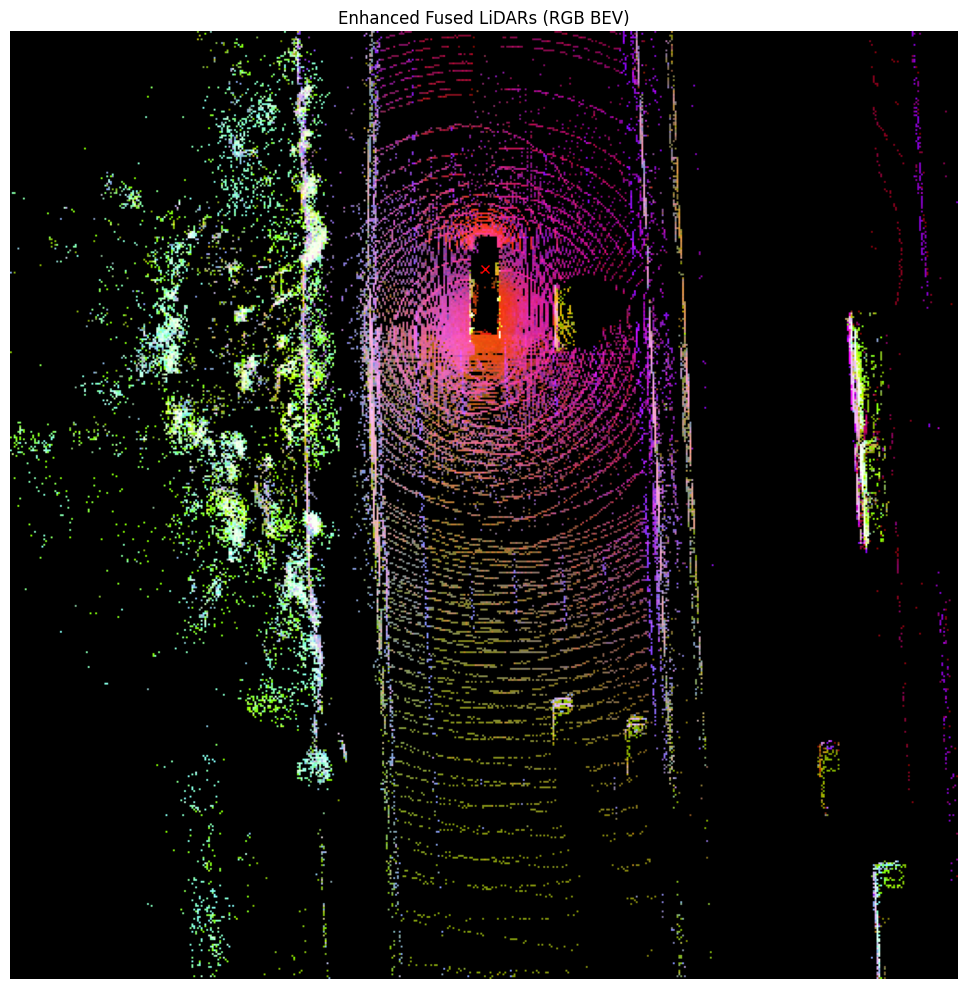

In [29]:
from scipy.spatial.transform import Rotation as R
import numpy as np
import cv2
from PIL import Image
from matplotlib import pyplot as plt
from truckscenes.utils.geometry_utils import transform_matrix
from pyquaternion import Quaternion
from truckscenes.utils.data_classes import LidarPointCloud


def bev_rgb_enhanced(points, intensities=None,
                     res=0.1,
                     side_range=(-40, 40), fwd_range=(-20, 60),
                     height_range=(-2, 2)):

    x, y, z = points[:, 0], points[:, 1], points[:, 2]
    if intensities is None:
        intensities = np.ones_like(x)

    # Applica il filtro per inquadrare l'area desiderata
    mask = (
        (x > fwd_range[0]) & (x < fwd_range[1]) &
        (y > side_range[0]) & (y < side_range[1])
    )
    x, y, z, intensities = x[mask], y[mask], z[mask], intensities[mask]

    # Converti in coordinate immagine
    x_img = ((x - fwd_range[0]) / res).astype(np.int32)
    y_img = ((y - side_range[0]) / res).astype(np.int32)
    H = int((fwd_range[1] - fwd_range[0]) / res)
    W = int((side_range[1] - side_range[0]) / res)

    # Mappa z e intensità su [0, 255]
    z_scaled = ((np.clip(z, *height_range) - height_range[0]) /
                (height_range[1] - height_range[0]) * 255).astype(np.uint8)
    intensities_scaled = ((intensities - np.min(intensities)) /
                          (np.ptp(intensities) + 1e-8) * 255).astype(np.uint8)

    # Crea 3 canali: R = densità, G = altezza, B = intensità
    R_chan = np.zeros((H, W), dtype=np.uint8)
    G_chan = np.zeros((H, W), dtype=np.uint8)
    B_chan = np.zeros((H, W), dtype=np.uint8)

    for xi, yi, zi, ii in zip(x_img, y_img, z_scaled, intensities_scaled):
        if 0 <= xi < H and 0 <= yi < W:
            G_chan[xi, yi] = max(G_chan[xi, yi], zi)
            B_chan[xi, yi] = max(B_chan[xi, yi], ii)
            R_chan[xi, yi] += 1

    # Normalizza canale R
    if R_chan.max() > 0:
        R_chan = np.clip((R_chan / R_chan.max()) * 255, 0, 255).astype(np.uint8)

    # Equalizzazione (facoltativa ma migliora il contrasto)
    R_eq = cv2.equalizeHist(R_chan)
    G_eq = cv2.equalizeHist(G_chan)
    B_eq = cv2.equalizeHist(B_chan)

    bev = np.stack([R_eq, G_eq, B_eq], axis=-1)
    bev = cv2.resize(bev, (512, 512), interpolation=cv2.INTER_NEAREST)

    return bev


def render_lidar_fused_enhanced(trucksc, sample_token: str, nsweeps: int = 1,
                                res=0.1, side_range=(-40, 40), fwd_range=(-20, 60),
                                height_range=(-3, 2),
                                figsize=(10, 10)):

    record = trucksc.get('sample', sample_token)

    # Trova tutti i token dei sensori lidar
    lidar_tokens = [
        token for channel, token in record['data'].items()
        if trucksc.get('sample_data', token)['sensor_modality'] == 'lidar'
    ]

    all_points = []

    for token in lidar_tokens:
        sd = trucksc.get('sample_data', token)
        sample = trucksc.get('sample', sd['sample_token'])
        chan = sd['channel']
        ref_chan = 'LIDAR_LEFT'
        ref_token = sample['data'][ref_chan]
        ref_sd = trucksc.get('sample_data', ref_token)

        pc, _ = LidarPointCloud.from_file_multisweep(trucksc, sample, chan, ref_chan, nsweeps=nsweeps)
        points = pc.points[:3, :]
        intensity = pc.points[3, :]

        # === Trasformazione in flat ego frame ===
        cs_record = trucksc.get('calibrated_sensor', ref_sd['calibrated_sensor_token'])
        pose_record = trucksc.get('ego_pose', ref_sd['ego_pose_token'])

        ref_to_ego = transform_matrix(cs_record['translation'], Quaternion(cs_record['rotation']))
        ego_yaw = Quaternion(pose_record['rotation']).yaw_pitch_roll[0]
        rotation_flat = np.dot(
            Quaternion(scalar=np.cos(ego_yaw / 2),
                       vector=[0, 0, np.sin(ego_yaw / 2)]).rotation_matrix,
            Quaternion(pose_record['rotation']).inverse.rotation_matrix
        )
        vehicle_flat = np.eye(4)
        vehicle_flat[:3, :3] = rotation_flat
        viewpoint = np.dot(vehicle_flat, ref_to_ego)

        points_h = np.vstack((points, np.ones(points.shape[1])))
        transformed = (viewpoint @ points_h).T[:, :3]

        all_points.append(np.hstack((transformed, intensity.reshape(-1, 1))))

    fused_points = np.vstack(all_points)

    # === Crea immagine BEV ===
    bev_img = bev_rgb_enhanced(fused_points[:, :3], fused_points[:, 3],
                               res=res,
                               side_range=side_range,
                               fwd_range=fwd_range,
                               height_range=height_range)

    # === Mostra immagine ===
    fig, ax = plt.subplots(1, 1, figsize=figsize)
    ax.imshow(bev_img)
    ax.axis('off')
    ax.set_title("Enhanced Fused LiDARs (RGB BEV)")

    # Centro veicolo (x=0, y=0)
    center_x = int((0 - fwd_range[0]) / res * 512 / ((fwd_range[1] - fwd_range[0]) / res))
    center_y = int((0 - side_range[0]) / res * 512 / ((side_range[1] - side_range[0]) / res))
    ax.plot(center_y, center_x, 'rx')

    plt.tight_layout()
    plt.show()


render_lidar_fused_enhanced(trucksc, "34d0b00f1801498c803ec07dce543b72")


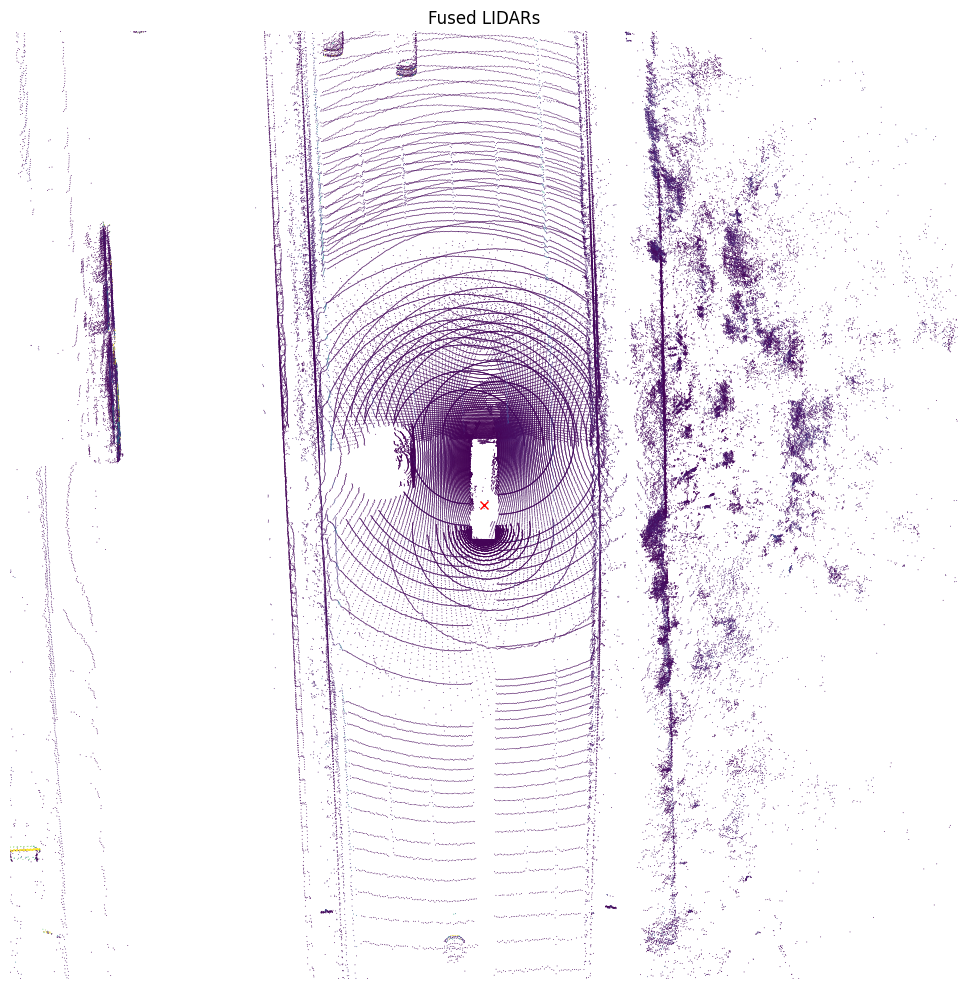

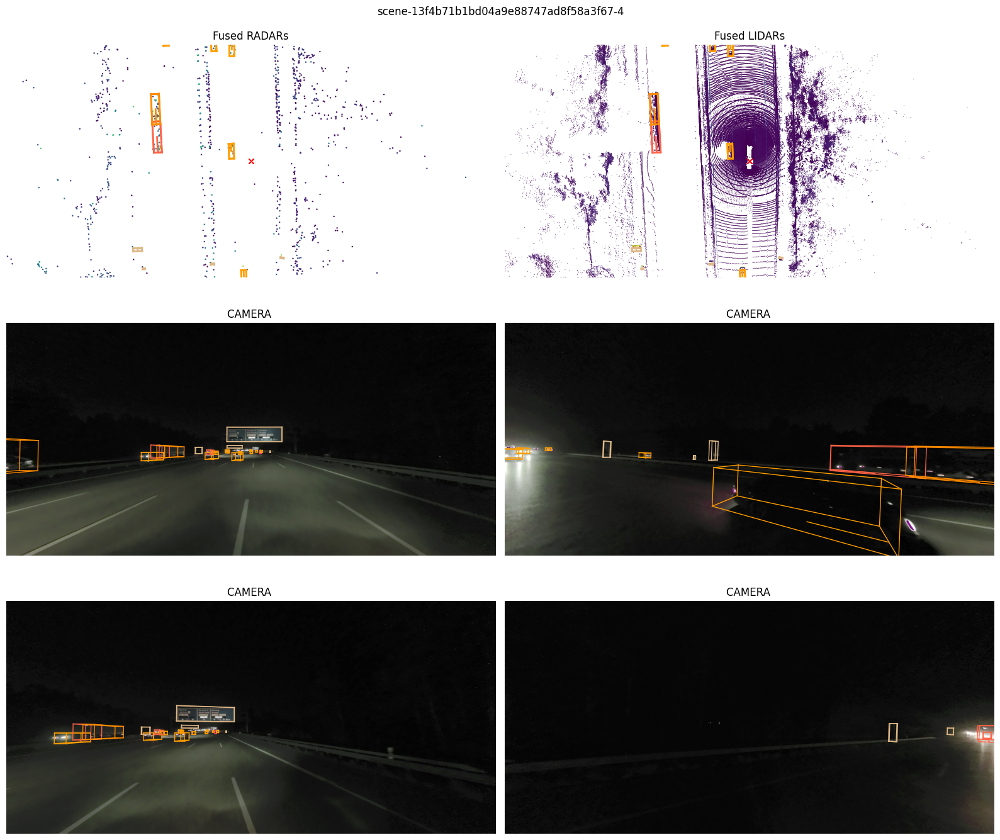

In [26]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable, get_cmap
from matplotlib.colors import Normalize, Colormap
from matplotlib import cm
from matplotlib.axes import Axes
from pyquaternion import Quaternion
from typing import List, Tuple, Union

# TruckScenes utils
from truckscenes.utils.geometry_utils import transform_matrix, view_points, BoxVisibility
from truckscenes.utils.data_classes import LidarPointCloud



def _render_pc_sample_data(trucksc,
                               sensor_modality: str,
                               sample_data_token: str,
                               with_anns: bool = True,
                               selected_anntokens: List[str] = None,
                               box_vis_level: BoxVisibility = BoxVisibility.ANY,
                               axes_limit: Union[List[float], Tuple[float], float] = 40,
                               ax: Axes = None,
                               nsweeps: int = 1,
                               use_flat_vehicle_coordinates: bool = True,
                               point_scale: float = 1.0,
                               cmap: str = 'viridis',
                               cnorm: bool = True) -> None:

        intensities = []
        points = []

        for sd_token in sample_data_token:
            sd_record = trucksc.get('sample_data', sd_token)

            sample_rec = trucksc.get('sample', sd_record['sample_token'])
            chan = sd_record['channel']
            ref_chan = 'LIDAR_LEFT'
            ref_sd_token = sample_rec['data'][ref_chan]
            ref_sd_record = trucksc.get('sample_data', ref_sd_token)

            if sensor_modality == 'lidar':
                # Get aggregated lidar point cloud in lidar frame.
                pc, _ = LidarPointCloud.from_file_multisweep(trucksc, sample_rec,
                                                             chan, ref_chan,
                                                             nsweeps=nsweeps)
                velocities = None
                intensity = pc.points[3, :]
            else:
                # Get aggregated radar point cloud in reference frame.
                # The point cloud is transformed to the reference frame
                # for visualization purposes.
                pc, _ = RadarPointCloud.from_file_multisweep(trucksc, sample_rec,
                                                             chan, ref_chan,
                                                             nsweeps=nsweeps)

                # Transform radar velocities (x is front, y is left),
                # as these are not transformed when loading the
                # point cloud.
                radar_cs_record = trucksc.get('calibrated_sensor',
                                                   sd_record['calibrated_sensor_token'])
                ref_cs_record = trucksc.get('calibrated_sensor',
                                                 ref_sd_record['calibrated_sensor_token'])
                velocities = pc.points[3:5, :]
                velocities = np.vstack((velocities, np.zeros(pc.points.shape[1])))
                velocities = np.dot(Quaternion(radar_cs_record['rotation']).rotation_matrix,
                                    velocities)
                velocities = np.dot(Quaternion(ref_cs_record['rotation']).rotation_matrix.T,
                                    velocities)
                velocities[2, :] = np.zeros(pc.points.shape[1])
                intensity = pc.points[6, :]

            # By default we render the sample_data top down in the sensor frame.
            # This is slightly inaccurate when rendering the map as the sensor frame may
            # not be perfectly upright.
            if use_flat_vehicle_coordinates:
                # Retrieve transformation matrices for reference point cloud.
                cs_record = trucksc.get('calibrated_sensor',
                                             ref_sd_record['calibrated_sensor_token'])
                pose_record = trucksc.get('ego_pose',
                                               ref_sd_record['ego_pose_token'])
                ref_to_ego = transform_matrix(translation=cs_record['translation'],
                                              rotation=Quaternion(cs_record["rotation"]))

                # Compute rotation between 3D vehicle pose and "flat" vehicle pose
                # (parallel to global z plane).
                ego_yaw = Quaternion(pose_record['rotation']).yaw_pitch_roll[0]
                rotation_vehicle_flat_from_vehicle = np.dot(
                    Quaternion(scalar=np.cos(ego_yaw / 2),
                               vector=[0, 0, np.sin(ego_yaw / 2)]).rotation_matrix,
                    Quaternion(pose_record['rotation']).inverse.rotation_matrix)
                vehicle_flat_from_vehicle = np.eye(4)
                vehicle_flat_from_vehicle[:3, :3] = rotation_vehicle_flat_from_vehicle
                viewpoint = np.dot(vehicle_flat_from_vehicle, ref_to_ego)

                # Rotate upwards
                vehicle_flat_up_from_vehicle_flat = np.eye(4)
                rotation_axis = Quaternion(matrix=viewpoint[:3, :3])
                vehicle_flat_up_from_vehicle_flat[:3, :3] = \
                    Quaternion(axis=rotation_axis.rotate([0, 0, 1]),
                               angle=np.pi/2).rotation_matrix
                viewpoint = np.dot(vehicle_flat_up_from_vehicle_flat, viewpoint)
            else:
                viewpoint = np.eye(4)

            # Show point cloud
            points.append(view_points(pc.points[:3, :], viewpoint, normalize=False))
            intensities.append(intensity)

        points = np.concatenate(points, axis=1)
        intensities = np.concatenate(intensities, axis=0)

        # Colormapping
        if cnorm:
            norm = Normalize(vmin=np.min(intensities), vmax=np.max(intensities), clip=True)
        else:
            norm = None
        mapper = ScalarMappable(norm=norm, cmap=cmap)
        colors = mapper.to_rgba(intensities)[..., :3]

        point_scale = point_scale * 0.4 if sensor_modality == 'lidar' else point_scale * 3.0
        ax.scatter(points[0, :], points[1, :], marker='o',
                   c=colors, s=point_scale, edgecolors='none')

        # Show ego vehicle
        ax.plot(0, 0, 'x', color='red')

        # Show boxes
        if with_anns:
            # Get boxes in lidar frame.box_vis_level
            _, boxes, _ = trucksc.get_sample_data(
                ref_sd_token, box_vis_level=box_vis_level, selected_anntokens=selected_anntokens,
                use_flat_vehicle_coordinates=use_flat_vehicle_coordinates
            )

            # Render boxes
            for box in boxes:
                c = np.array(trucksc.get_color(box.name)) / 255.0
                box.render(ax, view=np.eye(4), colors=(c, c, c), linewidth=2.0)

        # Limit visible range.
        ax.set_xlim(-axes_limit[0], axes_limit[0])
        ax.set_ylim(-axes_limit[1], axes_limit[1])


def render_sample_data(trucksc,
                           sample_data_token: str,
                           with_anns: bool = True,
                           selected_anntokens: List[str] = None,
                           box_vis_level: BoxVisibility = BoxVisibility.ANY,
                           axes_limit: Union[List[float], Tuple[float], float] = 40,
                           ax: Axes = None,
                           nsweeps: int = 1,
                           out_path: str = None,
                           use_flat_vehicle_coordinates: bool = True,
                           point_scale: float = 1.0,
                           cmap: str = 'viridis',
                           cnorm: bool = True) -> None:

        if not isinstance(sample_data_token, list):
            sample_data_token = [sample_data_token]

        if not isinstance(cmap, Colormap):
            cmap = plt.get_cmap(cmap)

        if not isinstance(axes_limit, (list, tuple)):
            axes_limit = [axes_limit, axes_limit]

        # Determine sensor modality
        sensor_modality = trucksc.get('sample_data', sample_data_token[0])['sensor_modality']

        # Render Point Cloud data
        if sensor_modality in ['lidar', 'radar']:
            # Init axes.
            if ax is None:
                _, ax = plt.subplots(1, 1, figsize=(9, 9))

            # Render point cloud data onto axis
            _render_pc_sample_data(trucksc, sensor_modality, sample_data_token, with_anns,
                                        selected_anntokens, box_vis_level, axes_limit,
                                        ax, nsweeps, use_flat_vehicle_coordinates,
                                        point_scale, cmap, cnorm)



        ax.axis('off')
        ax.set_title('{} {labels_type}'.format(sensor_modality.upper(), labels_type=''))
        ax.set_aspect('equal')

        if out_path is not None:
            os.makedirs(os.path.dirname(out_path), exist_ok=True)
            plt.savefig(out_path, bbox_inches='tight', pad_inches=0, transparent=True, dpi=800)


def render_lidar_fused(trucksc, sample_token: str, nsweeps: int = 1,
                       axes_limit: Union[List[float], Tuple[float], float] = 40,
                       use_flat_vehicle_coordinates: bool = True,
                       point_scale: float = 1.0,
                       cmap: str = 'viridis',
                       cnorm: bool = True):
    record = trucksc.get('sample', sample_token)

    # Estrai sample_data dei soli sensori LiDAR
    lidar_tokens = [
        token for channel, token in record['data'].items()
        if trucksc.get('sample_data', token)['sensor_modality'] == 'lidar'
    ]

    # Crea la figura
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    # Usa la funzione di rendering dei dati fusi
    render_sample_data(
        trucksc=trucksc,
        sample_data_token=lidar_tokens,  # <<< Passiamo tutti i token insieme
        with_anns=False,
        ax=ax,
        nsweeps=nsweeps,
        use_flat_vehicle_coordinates=use_flat_vehicle_coordinates,
        point_scale=point_scale,
        cmap=cmap,
        cnorm=cnorm,
        axes_limit=axes_limit
    )

    ax.set_title("Fused LIDARs")
    plt.tight_layout()
    plt.show()




token="34d0b00f1801498c803ec07dce543b72"

render_lidar_fused(trucksc, sample_token="34d0b00f1801498c803ec07dce543b72")


trucksc.render_sample(token)
